### University of Michigan - ROB 101 Computational Linear Algebra - Fall 2022

# Project 1: Robotic Mapping with LIDAR Data

#### Welcome to the world of Linear Transformations. 
In this project we will help you to experience how powerful matrix algebra is in handling large (HUGE) quantities of data. 

## Task 1 (10 Points)

In this task, you will plot simple shapes and apply different transformations. The goal is to learn a matrix version of what mathematicians call "affine transformations". You will learn a special way to write coordinates that roboticists use on a regular basis: *homogeneous coordinates*.

In [10]:
# Run me, do not change me! I am creating a few utility 
# plotting functions to use throughout this project


#=
    This function generates a 2D Plot
    Mandatory parameters are
                        xdata -> x coordinates
                        ydata -> y coordinates
                        color -> plot color
=#
function plot_2D(xdata::Vector{Float64}, ydata::Vector{Float64}, color; 
                 new=true, aspect_ratio=:equal, 
                 xlims = (-2,2), ylims = (-2,2), grid=true,
                 framestyle=:origin, legend=false, linewidth=3)
    fxn = new ? plot : plot! 
    fxn(xdata, ydata, seriescolor=color, aspect_ratio=aspect_ratio, xlims=xlims,
        ylims=ylims, grid=grid, framestyle=framestyle, legend=legend, 
        linewidth=linewidth)
end


#=
    This function generates a 2D Point Cloud Plot
    Mandatory parameters are
                        xdata -> x coordinates
                        ydata -> y coordinates
                        color -> pointcloud color
=#
function plot_2D_pointcloud(xdata::Vector{Float64}, ydata::Vector{Float64}, color; 
                new=true, seriestype=:scatter, markersize = 0.8, 
                markerstrokewidth = 0, dpi = 150, legend = false,
                markercolor  = cgrad(:rainbow, rev = true))
    fxn = new ? plot : plot!
    fxn(xdata, ydata, seriestype=seriestype, markersize=markersize, 
        markerstrokewidth=markerstrokewidth, dpi=dpi, 
        markercolor=markercolor, marker_z=color, legend=legend)
end


#=
    This function generates a 3D Point Cloud Plot
    Mandatory parameters are
                        xdata -> x coordinates
                        ydata -> y coordinates
                        zdata -> z coordinates
                        limits -> tuple of coordinate limits
                        color -> pointcloud color
=#
function plot_3D_pointcloud(xdata::Vector{Float64}, ydata::Vector{Float64}, zdata::Vector{Float64}, 
        limits, color::Vector{Float64};
        seriestype=:scatter3d, markersize=0.1, camera=(0,90), dpi=1080,
        markercolor=cgrad(:rainbow, rev=true), background_color=:black, 
        foreground_color=:black, legend=false, aspect_ratio=1, new=false)
    fxn = new ? plot : plot!
    fxn(xdata, ydata, zdata, xlims=limits[1], ylims=limits[2], zlims=limits[3], 
        seriestype=seriestype, markersize=markersize, camera=camera, dpi=dpi,
        markercolor=markercolor, marker_z=color, background_color=background_color,
        foreground_color=foreground_color, legend=legend, aspect_ratio=aspect_ratio)
end


#=
    This function plots the robot in 2D as a quiver
    Mandatory parameters are
                        xpos -> x coordinate of robot
                        ypos -> y coordinate of robot 
                        limits -> tuple of coordinate limits
                        gradient -> robot orientation (u,v)
=#
function plot_2D_robot(xpos::Vector{Float64}, ypos::Vector{Float64}, limits, gradient;
        seriestype=:quiver, projection="3d", arrow=(10,10), camera=(0,90), dpi=1080,
        background_color=:black, foreground_color=:black, legend=false, aspect_ratio=1, 
        seriescolor=:white, new=false)
    fxn = new ? plot : plot!
    fxn(xpos, ypos, seriescolor=seriescolor, seriestype=seriestype, projection=projection, 
        gradient=gradient, arrow=arrow, xlims=limits[1], ylims=limits[2], zlims=limits[3], 
        camera=camera, dpi=dpi, background_color=background_color, 
        foreground_color=foreground_color, legend=legend, aspect_ratio=aspect_ratio)
end


#=
    This function generates a 3D Point Cloud Plot
    Mandatory parameters are
                        xpos -> x coordinate of robot
                        ypos -> y coordinate of robot
                        zpos -> z coordinate of robot
=#
function plot_3D_robot(xpos::Vector{Float64}, ypos::Vector{Float64}, zpos::Vector{Float64}; 
                    markersize=4, seriestype=:scatter3d, seriescolor=:white, new=false)
    fxn = new ? plot : plot!
    fxn(xpos, ypos, zpos, seriescolor=seriescolor, markersize=markersize, seriestype=seriestype)
end
    

plot_3D_robot (generic function with 1 method)

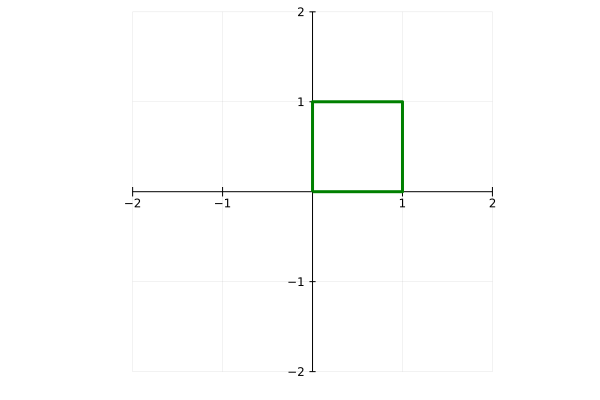

In [2]:
# Run me, do not change me! I am creating a set of points to form a 
# square when plotted
using Plots
default(fmt = :png)

#= Define points to form a square, note there are five points, because 
   we need to come back to the first point to complete the square for 
   plotting (connecting lines) =#

# [x1 y1; x2 y2; ...; x5 y5]' 
points = [0. 0.; 0. 1.;1. 1.; 1. 0.; 0. 0.]';

# After the transpose, the array points looks like this
# [x1 x2 ... x5; 
#  y1 y2 ... y5]

# x coordinates extracted from the array
x = points[1,:]

# y coordinates extracted from the array
y = points[2,:]

# plotting the array of points in the same plot as a coordinate frame  
plot_2D(x, y, :green)

##### ### Here are three very important operations on points: 

a) translation, which means $\begin{bmatrix} x' \\ y' \end{bmatrix}=\begin{bmatrix} x \\ y \end{bmatrix} + \begin{bmatrix} t_x \\ t_y \end{bmatrix}$, where $t_x$ and $t_y$ are given constants. Here, x' is a new x point. It is not a transpose. The same goes for y'.

b) rotating an object by a given angle, which will will turn out to look like this 
$\begin{bmatrix} x'\\y'\end{bmatrix} = \begin{bmatrix}\cos{\theta}&-\sin{\theta} \\ \sin{\theta}&\cos{\theta}\end{bmatrix} \cdot \begin{bmatrix}x\\y\\ \end{bmatrix}$
where $\theta$ is the angle by which we wish to rotate a set of points in the counterclockwise direction, and finally

c) scaling the x and y coordinates of a set of points to stretch an object or contract it, potentially by diffrent amounts in the x and y directions. Scaling looks like this
$\begin{bmatrix} x'\\y' \end{bmatrix} = \begin{bmatrix}S_x&0\\0&S_y\\ \end{bmatrix} \cdot \begin{bmatrix}x\\y\\ \end{bmatrix}$

We will tackle these operations one by one in what follows. The first thing we notice is that rotation and scaling involve matrix-vector multiplication, while translation involves adding two vectors. Even though addition seems simpler than multiplication, in what you may pereceive as a perverse use of mathematics, we are going to show you how to turn translation into matrix multiplication! The fruit of our labor will be a uniform way in which to write down these three operations and that will simplify our manipulation of the roughly 185 MB of LiDAR data.



### Part A: The first operation we will perform on our square is to translate it. The corresponding mathematical operation is called "translation" (2 points)

We will translate each point by -0.5 in x and -0.5 in y so as to center our square around the origin. 

**Your task:** Apply a translation $\begin{bmatrix} x \\ y \end{bmatrix} \mapsto \begin{bmatrix} x \\ y \end{bmatrix} + \begin{bmatrix} t_x \\ t_y \end{bmatrix}$ to the points that form the square using vector addition. We will then work toward using matrix multiplication. Here $\begin{bmatrix} t_x \\ t_y \end{bmatrix} = \begin{bmatrix} -0.5 \\ -0.5 \end{bmatrix}$. Store the translated points in an array called points2. 

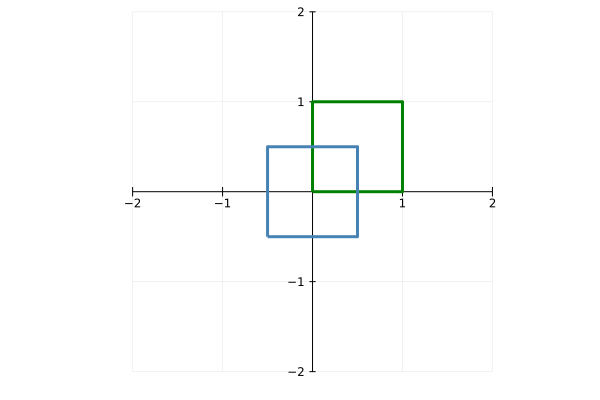

In [3]:
# Define the translation vector t
t = [-0.5; -0.5]

# Make a copy of the original points and call it points2
points2 = copy(points)

# Your job: modify the values of points2 so that the x-y values are 
# indeed translated by the vector t. You will need a for loop.

# Hint: if you get stuck, read a few cells ahead and look for a 
# for loop. Your for loop here will not be exactly the same, but 
# still, it will bear similarities.

# your code here
for i in 1:size(points2,2)           
    points2[:,i] = t + points2[:,i];

end 

x2 = points2[1,:];
y2 = points2[2,:];
 
plot_2D(x2, y2, :steelblue, new=false)

In [4]:
# Autograder cell

In [5]:
println("If you do not pass the test, you can go back and fix your work!")

# friendly check
# if the value of is_it_correct_checkN is "Yes", then your answer 
# may be correct. However, if the value of is_it_correct_checkN is "No", 
# then your answer is wrong

is_it_correct_check1 = ((points2 - points) == hcat([t for i=1:size(points2,2)]...)) ? "Yes" : "No"

@show is_it_correct_check1;  

If you do not pass the test, you can go back and fix your work!
is_it_correct_check1 = "Yes"


### Part B: Translation as matrix multiplication in homogeneous coordinates (1 point)

Our goal here is to show how the operation of translation can be written as a matrix-vector multiplication. Roboticists want to do this so that the three operations, translation, rotation, and scaling can be written in exactly the same format. This extra bit of work makes manipulating huge files of LiDAR data much easier.

We pose the question: how can we use matrix multiplication to apply a translation? The answer is, we need to use a trick that's called homogeneous coordinates. This is a simple operation on our data as we just need to append a 1 to each point [x;y]. That is, we convert $\begin{bmatrix} x \\ y \end{bmatrix}$ to homogeneous coordinates by $$\begin{bmatrix} x \\ y \\ 1 \end{bmatrix} .$$
The inverse operation, taking a vector of homoegeneous coordinates and dropping the 1, produces the original vector [x;y]. This seems almost too simple to bother mentioning, but we do it anyway!

We claim that we can perform vector translation by multiplying a vector in homogemeous coordinates by the matrix $$ T = \begin{bmatrix} 1 & 0 & t_x \\ 0 & 1 & t_y \\ 0 & 0 & 1 \end{bmatrix}.$$

Let's see if this actually works $$ \begin{bmatrix} 1 & 0 & t_x \\ 0 & 1 & t_y \\ 0 & 0 & 1 \end{bmatrix} \cdot \begin{bmatrix} x \\ y \\ 1 \end{bmatrix} = \begin{bmatrix} x + t_x \\ y + t_y \\ 1 \end{bmatrix}.$$
And when we drop the 1 to put our transformed vector back in the ordinary Cartesian coordinates we have
$$ \begin{bmatrix} x + t_x \\ y + t_y \end{bmatrix},$$
ta da! It's Ok if you're not overwhelmed by this operation. We like to build toward a crescendo! 

<!-- ## Is this statement needed here?
In general a 2D affine transformation takes the following form $$H_{3\times 3} = \begin{bmatrix} A_{2\times 2} & t_{2\times 1} \\ 0_{3\times 1} & 1 \end{bmatrix}.$$
If $A$ is a rotation matrix, then $H$ will be a *rigid body transformation*. -->

**A task that we will do for you:** Implement the translation of the square using homogeneous coordinates and the above translation matrix. Pay attention here because there is code that you will want to copy and modify just a little bit when you perform rotation and scaling in homogeneous coordinates!

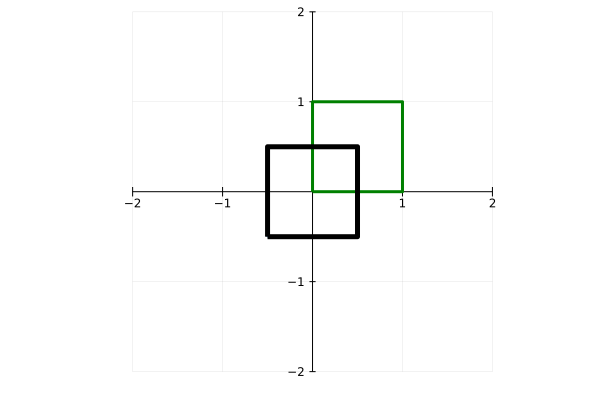

In [6]:
# Define the translation matrix T
T = [1 0 -0.5;0 1 -0.5; 0 0 1];


# Ignore the your code comment. You don't need to add any code here! 
# your code here
#throw(ErrorException())

# Make a copy of the original points
points3 = copy(points);

# Append 1 to each point to make homogeneous coordinates
points3 = [points3; ones(1,5)];

# Apply the translation to each of the points that form our square
points3 = T * points3 

#= Remark: We could have used a for loop as shown next


for i in 1:size(points3,2)           # Multiplies each column of  
    points3[:,i] = T * points3[:,i]; # points3 by the tranform T
end 

However, points3 = T * points3 does the same thing because
T * points3 = [ T*points3[:,1]  T*points3[:,2] ... T*points3[:,end] ]


The `vectorized' operation ends up being 2x faster and uses 7x less memory!
 
You are free to use whichever method your prefer as you proceed with
this project.
=#   

# Extract x and y coordinates and throw away the last one
x3 = points3[1,:];
y3 = points3[2,:];
 
plot_2D(x3, y3, :black, new=false, linewidth=5)

In [7]:
# Autograder cell, just checking that you have the right set of points 
# after this task

### Part C: Rotation in Homegenous Coordinates (2 points)

We now use the 2D rotation matrix in homogeneous coordinates:

$\begin{bmatrix} x'\\y'\\1 \end{bmatrix} = \begin{bmatrix}\cos{\theta}&-\sin{\theta}&0\\\sin{\theta}&\cos{\theta}&0\\0&0&1\\ \end{bmatrix} \cdot \begin{bmatrix}x\\y\\1\\ \end{bmatrix}$

**Your task:** Rotate our square in the x-y plane by 45 degrees ($\pi/4$). Build the transformation matrix to transform the square.     

You do not need a friendly check cell because you can
compare your plot to the one in the PDF of the project.


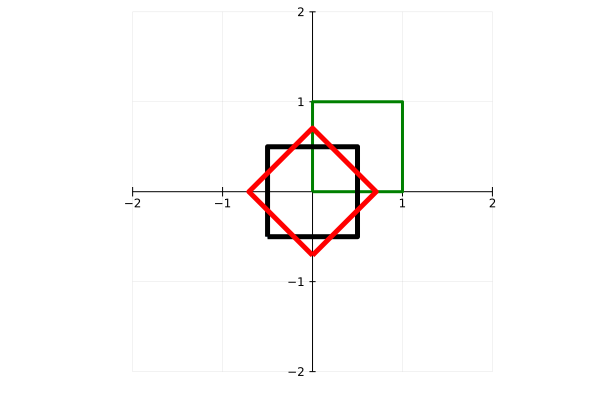

In [8]:
# Finish this portion of the the code to do the matrix multiplication 
# that does the Transformation. Modify the points3 array to contain the 
# result of the transformation, like we did before!

# Hint: Do not re-initialize with the original green sqaure; 
# instead, directly modify the points3 array (black square)
# Note: Make sure you have right square (comparing with the black 
# square in the pdf) 

# your code here
# Append 1 to each point to make homogeneous coordinates
#new = [points3; ones(1,5)];


T = [cos(pi/4) -sin(pi/4) 0 ; sin(pi/4) cos(pi/4) 0; 0 0 1]
points3 = T * points3


# Extract x and y coordinates and throw away the last one
x3 = points3[1,:]
y3 = points3[2,:]

println("You do not need a friendly check cell because you can")
println("compare your plot to the one in the PDF of the project.")
 
plot_2D(x3, y3, :red, new=false, linewidth=5)


In [9]:
# Autograder cell, just checking if you have the right set of points after this task

### Part D: Scaling (2 points)

Next, we're going to scale the square, which means that we "stretch" its sides like a rubber band. Mathematicians sometimes call such transformations *non-rigid*. The scale transformation matrix in 2D is given as:

$\begin{bmatrix} x'\\y'\\1 \end{bmatrix} = \begin{bmatrix}S_x&0&0\\0&S_y&0\\0&0&1\\ \end{bmatrix} \cdot \begin{bmatrix}x\\y\\1\\ \end{bmatrix}$


**Your task:** Scale the rotated square using $S_x = 1.5$ and $S_y = 0.5$

You do not need a friendly check cell because you can
compare your plot to the one in the PDF of the project.


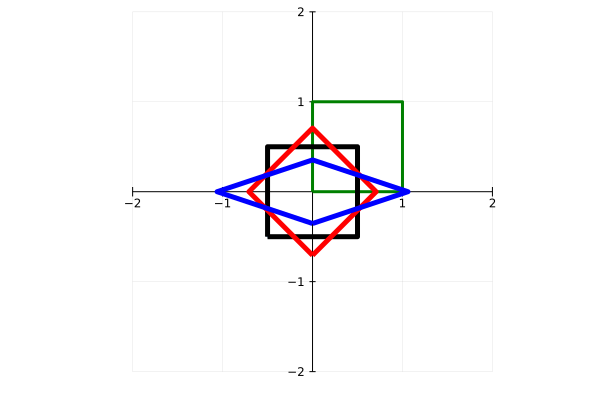

In [10]:
# Finish this portion of the the code to do the matrix multiplication 
# that implements the scaling Tranformation. In particular, modify the 
# points3 array to contain the result of the transformation, like 
# we did before!
#
# Note: Make sure you have the right square (comparing with the red square 
# in the pdf). So your points3 array is correct and ready to be modified!  


# your code here
T = [1.5 0 0; 0 0.5 0; 0 0 1]
points3 = T* points3

# Extract x and y coordinates and throw away the last one
x3 = points3[1,:]
y3 = points3[2,:]

println("You do not need a friendly check cell because you can")
println("compare your plot to the one in the PDF of the project.")
 
plot_2D(x3, y3, :blue, new=false, linewidth=5)

In [11]:
# Autograder cell, just checking if you have the right set of points after this task

### Part E: Putting it all together: Affine Transformations (3 points)


All the transformations we have done so far (translation, rotation, and scaling), and even combinations of them, are called Affine Transformations.

When we work with big data sets and we need to apply a sequence of translations, rotations, and scalings to a set of points, you can imagine that keeping track of everything during the transformation processes could become cumbersome over time. 

The saving feature of using the abstract notion of an Affine Transformation is that we can build a complicated transformation by multiplying together the individual transformations considered one at a time. For example, let's suppose we want to translate a set of points by [-0.5;-0.5], then rotate the translated object counterclockwise by 45 degrees, and then finally scale the translated and rotated object! That's a lot of transformations! Yes, but we can write the overall transformation as simply as this


$$T = \begin{bmatrix}1.5&0&0\\0&0.5&0\\0&0&1\\ \end{bmatrix} \cdot \begin{bmatrix}\cos(\pi/4)&-\sin(\pi/4)&0\\\sin(\pi/4)&\cos(\pi/4)&0\\0&0&1\\ \end{bmatrix} \cdot \begin{bmatrix}1&0&-0.5\\0&1&-0.5\\0&0&1\\ \end{bmatrix}$$

What have we done? We prepared the overall homogeneous transformation by multiplying three individual homogeneous transformations, which we can then apply all at once to our point [x;y], once we express it in homogeneous coordinates as [x;y;1]

Is your mind blown yet?

#### Your task is to implent the above sequence of transformations on the original square. 

In the next cell, build the transformation matrix T and then apply it to our vector "points". Whatever you do, do not multiply out the above matrices by hand and then enter one matrix. Write T as the product of three homegeneous matrices and let Julia do the matrix multiplication for you.

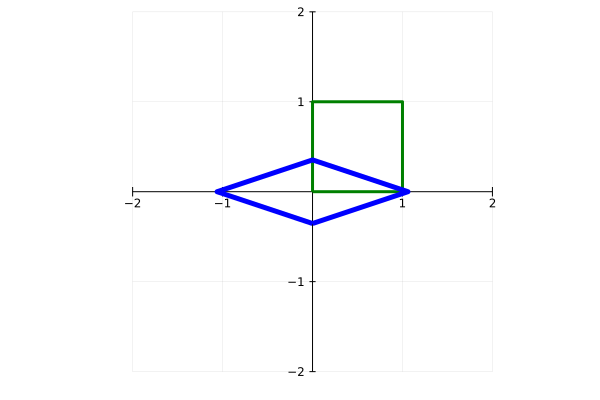

In [12]:
# We start you out by making a copy of the original points and appending 
# a 1 to each point. # For later use, note the very efficient manner 
# in which we add a row of 1's to the array points.

points4 = [copy(points); ones(1,5)]

# Finish this portion of the the code to do the matrix multiplication 
# that does the Tranformation. In particular, modify the points4 array 
# to contain the result of the affine transformation

# your code here
T = [1.5 0 0; 0 0.5 0; 0 0 1] * [cos(pi/4) -sin(pi/4) 0 ; sin(pi/4) cos(pi/4) 0; 0 0 1] * [1 0 -0.5; 0 1 -0.5; 0 0 1]

points4 = T * points4
# Extract x and y coordinates and throw away the last one
x4 = points4[1,:]
y4 = points4[2,:]
 
plot_2D(x, y, :green)
plot_2D(x4, y4, :blue, new=false, linewidth=5)

In [13]:
# Autograder cell is checking that you have the right set of points 
# after this task. You can check your work by comparing the blue "diamond"
# in the above plot to your previous plot. 

# Task 2 (2 Points)

In this task, we will work with 2D point clouds. This is our final step before moving onto the 3D point clouds collected with Cassie Blue. Are you getting anxious? 

A point cloud is simply a collection of points in space (3D and more) or a plane (2D). So for a 2D point cloud, the first two rows of the data contain the x and y coordinates of our point respectively. And the third row contains additional information about our point, which for the case of a LiDAR sensor is the Intensity, and for a camera is the RGB values (red, green, blue color information). 

For your 2D pointcloud, think of it as a camera image. The pointcloud is thus in a plane and the color data is given in simplified rgb encoding with values between (0, 1). Think about it as a rainbow, where red has value 0 and blue has value 1. 

We provide you a distorted image, which makes it very hard to read the text. We want to apply an affine transformation to correct the point cloud to make it readable. Let's first read the contents of the file "question_image.csv" into an array (use the function *readdlm*), and plot the points in a scatter plot. This part is provided. 

In [1]:
using DelimitedFiles
using Plots
default(fmt = :png)

pointcloud = readdlm("data/question_image.csv",',')

# The x and y coordinates for the first 2 rows of the data 
# can be extracted from the array separately
point_data = pointcloud[1:2,:]

# The intensity data of the pointcloud forms the last row, and 
# can be saved separately
println("Look at the size of the data you are manipulating!")
color_data = pointcloud[3,:]

Look at the size of the data you are manipulating!


29423-element Vector{Float64}:
 0.0
 3.39881721161036e-5
 6.79763442322072e-5
 0.000101964516348311
 0.000135952688464414
 0.000169940860580518
 0.000203929032696622
 0.000237917204812725
 0.000271905376928829
 0.000305893549044932
 0.000339881721161036
 0.00037386989327714
 0.000407858065393243
 ⋮
 0.999626130106723
 0.999660118278839
 0.999694106450955
 0.999728094623071
 0.999762082795187
 0.999796070967303
 0.999830059139419
 0.999864047311536
 0.999898035483652
 0.999932023655768
 0.999966011827884
 1.0

In [2]:
# Plot the 2D point cloud data with intensity values! 
plot_2D_pointcloud(point_data[1,:], point_data[2,:], color_data)

LoadError: UndefVarError: plot_2D_pointcloud not defined

Luckily, the homogeneous transformation for correcting the image is known to be

$$ T = \begin{bmatrix}-0.09239&0.038268&300\\-0.38268&-0.923879&165\\0&0&1\\ \end{bmatrix}$$
      
**Your task:** Apply $T$ to the distorted point cloud and plot the corrected image.

In [6]:
X = [copy(point_data); ones(1,size(point_data,2))]; # Create homogeneous 
                                                    # points


T = [-0.09239 0.038268 300; -0.38268 -0.923879 165; 0 0 1]
X = T * X
#= This part of the code should accomplish the following:
1. Build the Transformation matrix
2. Loop over all the points (i.e. iterate from index 1 to number of 
   columns in X) and multiply the Transformation to get what we call 
   a transformed pointcloud. 
3. Save your results directly in the X array, don't change the names, 
   our plots depend on it! =#

# your code here


3×29423 Matrix{Float64}:
  -2.00367  -16.0034  -15.0041  …    -8.00602    -7.00985    -6.00406
 165.011    164.066   163.984      -172.995    -173.004    -172.983
   1.0        1.0       1.0           1.0         1.0         1.0

In [7]:
# friendly check
# if the value of is_it_correct_checkN is "Yes", then your answer may be correct. 
# If the value of is_it_correct_checkN is "No", then your answer is wrong

is_it_correct_check1 = abs((X[3, :] - ones(size(X, 2)))[1]) < 1e-4 ? "Yes" : "No"
is_it_correct_check2 = abs(sum(X[2, :]) - -54512.825647621416) < 1e-4 ? "Yes" : "No"
is_it_correct_check3 = abs(sum(X[:,1]) - 164.00782569999998) < 1e-4 ? "Yes" : "No"
is_it_correct_check4 = abs(sum(X[:, 5]) - 152.0378589000001) < 1e-4 ? "Yes" : "No"
is_it_correct_check5 = abs(sum(X) - -181258.1626895815)< 1e-4 ? "Yes" : "No"

@show is_it_correct_check1; 
@show is_it_correct_check2;
@show is_it_correct_check3; 
@show is_it_correct_check4;
@show is_it_correct_check5;

is_it_correct_check1 = "Yes"
is_it_correct_check2 = "Yes"
is_it_correct_check3 = "Yes"
is_it_correct_check4 = "Yes"
is_it_correct_check5 = "Yes"


In [8]:
#autograder cell
test_x = [-2.003666599999974 -16.003373200000055 -15.004140000000007 -14.008733599999971 -13.004088200000012; 165.01149229999996 164.06631959999987 163.98384749999994 163.9937632999999 164.0419471000001; 1.0 1.0 1.0 1.0 1.0];
@assert isapprox(X[:,1:5], test_x, atol = 0.001)

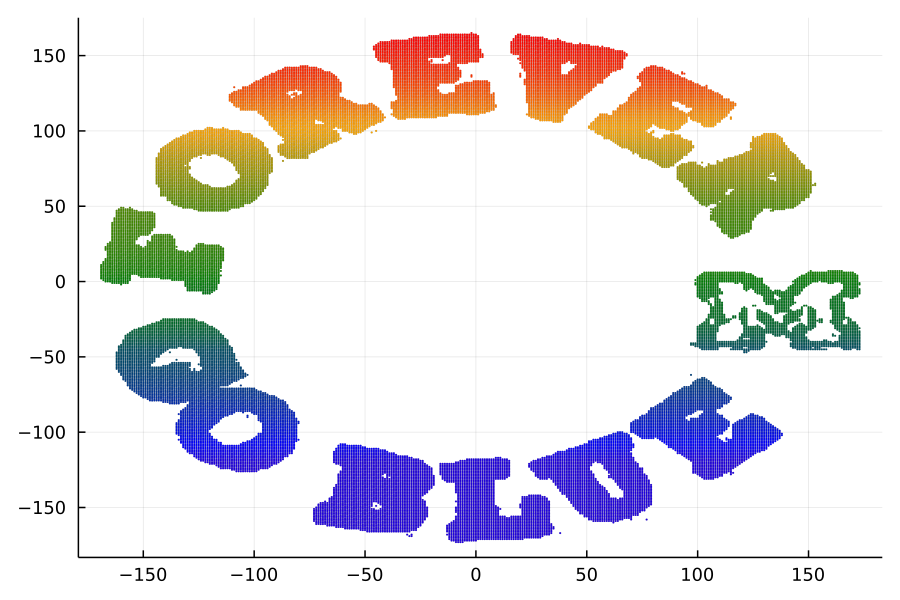

In [11]:
# Only run this cell if you passed the Friendly Check as it can 
# take a while to generate the plot if many of you are 
# working at the same time
plot_2D_pointcloud(X[1,:], X[2,:], color_data)

# Task 3 (8 Points)

As a motivator, at the end of this Task you will able to generate a plot like this one. Can you identify the location on the Universtity of Michigan's North Campus? 



<img src="https://i.postimg.cc/qBFQ1ZZF/Task3.png" alt="Go Blue" width="900">



Now that we have seen the power of matrix transformations in 2D, let's move on to the more challenging case of 3D. You won't have you worry about the plotting in this case either as the plotting code is given to you. 

Your first task is to plot the raw point cloud data obtained from Cassie's LiDAR over a period of 1 second. Running Cassie's LiDAR at 10 Hz, we have collected 10 different scans of LiDAR data over the one second interval and combined them into one big file. You will see how huge the file is while working on this problem, and appreciate what it means to do math at scale!

The collected data is in the frame of the LiDAR, which moves with the robot. See the PDF file for how the data is organized. If you have not read it, stop now! To help you out with the data management, which is not a focus of ROB 101, we have built for you a data_parser function that organises the information from a slew of csv files into different meaningful arrays. The function ```data_parser``` will parse each second of your data set into five different arrays that you will need for this problem. 

The input to the ```data_parser``` is the time interval number of the data set, with $id \in \{ 9, 10, \cdots, 13\}$ which gives the identity of a data set (the corresponding time). It must be passed as an argument to the function and the data returned should be saved in the same order that it is produced by parser. See the first cell in Part A for more details. 

The different arrays that will contain the data are given as:

- pointcloud_data: This has the xyz coordinates of the point cloud

- Intensity_data: The LIDAR Intensity data is saved in the array called Intensity_data

- R: Rotation Matrix 

- t: Translation vector

- pose: Gives the true position (xyz, column 1) and orientation (column 2) of the robot

We will see an example call to this function very soon in Part A!


In [12]:
# Run me, you cannot change me

using DelimitedFiles
using Plots
default(fmt = :png)

# This is the data parser and helper functions block. Run as is.
# You will learn how to build functions in lab4

function data_parser(id)
    # load point cloud from file
    points = readdlm(string("data/cassie_data/Frame_",
             string(id),"/pointcloud.csv"),',');
    pointcloud_data = points[1:3,:]; # xyz
    Intensity_data = points[4,:]; # intensity
    
    # load the different transformation from the file, connect 
    # with the information learned in Task 1 
    Transformations = readdlm(string("data/cassie_data/Frame_",
            string(id),"/Transformations.csv"),',');
    R = Transformations[:,1:3]; # rotation
    t = Transformations[:,4]; # translation
    
    # Also get the position of the the robot from another file 
    pose = readdlm(string("data/cassie_data/Frame_",string(id),
            "/Position.csv"),',');
    return (pointcloud_data, Intensity_data, R, t, pose)
end

# Example call to the function, the data for interval id 10 of the 
# video is being parsed 
# (pointcloud_data,Intensity_data,R,T,position) = data_parser(10)

# This function will apply a transformation to all points

#= note that this is the exact same function from a previous Task 
generalized to handle matrices of all sizes, instead of just 5. 
How do we know that? look at the iterator i, and its end value is 
determined by the number of colmuns that are in matrix points =#

function affine_transform(points, H)
    # Make a copy of the original points and append 1 to each point, 
    # (Homogenizing)
    transformed_p = [copy(points); ones(1,size(points,2))];
    
    # Transform 3D points, looping over all points and multiplying 
    # the Transformation matrix, exactly like Task 1!
    transformed_p = H * transformed_p
    
    # Remember to return the de-homogenized array, i.e.,
    # transformed_points should have same size as input points     
    return transformed_p[1:3,:];
end

#= A function to get robot heading at its position, this is more 
   of a hack that we use to get the arrow 
   of our position estimate when plotting, you are definitely 
   not expected to understand it. =#

function robot_arrow(pose)
    position = pose[:,1]; # position
    (roll,pitch,yaw) = pose[:,2]; # orientation
    
    # extract rotation axis! 
    u = [1*cos(yaw-pi/2)]
    v = [1*sin(yaw-pi/2)]
    return (position, u, v)
end

# Define the viewing window size for setting x and y axis limits, 
# and other plotting parameters
window_size = 15
min_x = -window_size
min_y = -window_size
max_y = window_size
min_z = 0
max_z = 2*window_size
max_x = window_size;
limits = ((min_x, max_x), (min_y, max_y), (min_z, max_z))

((-15, 15), (-15, 15), (0, 30))

### Part A (4 points)
Here we are showing you how the data is parsed and saved into arrays. You need to pay attention even though you are not required to modify any of the code. 

The next cell reads the raw point cloud in the last data collection instant, which is at time 13 seconds (id = 13). This must be passed as the interval id to our function ```data_parser```. As discussed before, the function gives us point cloud data, intensity data, the rotation matrix R, and the translation vector t to build an affine transformation, and finally an estimate of the robot's pose, that is, its position and orientation. 

In [13]:
# Run me, do not change me
# Example call to the function, to get the data at time = 13 seconds 
# of data collection
id = 13

# save the data into different arrays
(point_data, intensity_data, R, t, pose) = data_parser(id)

# Lets see the size of the pointcloud and appreciate the challenge 
# of the problem at hand

size(point_data) 

(3, 696496)

### As mentioned earlier, the LiDAR data is collected in the frame of the LiDAR while the robot is moving. Hence, each frame of LiDAR data is taken from a different position and orientation of the robot. This is analogous to you walking and taking PHOTOS (not video) and then you trying to overlay the photos to create a single image. What would you expect to see? A mess? 

### To underline the importance of keeping track of the position and orientation of Cassie while she is moving, we are going to overlay multiple LiDAR scans without first transforming them to a common coordinate system (which we call a world frame). 

## We are deliberately going to make a mess of things. The following plot takes some time to generate.

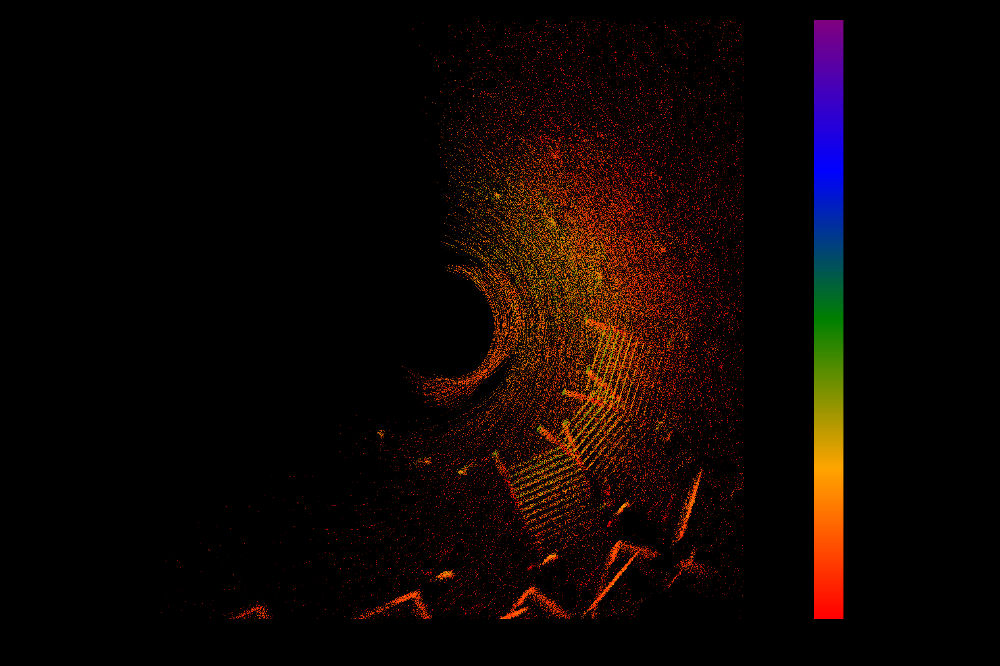

In [14]:
# Run me and be patient. To speed things up, we are skipping 
# half the data here
start_index = 9
end_index  = 13

plot()
for id = start_index:2:end_index 
    # save the data into different arrays
    (point_data, intensity_data, R, t, pose) = data_parser(id) 
    plot_3D_pointcloud(point_data[1,:], point_data[2,:], point_data[3,:], limits, intensity_data) 
end

display(plot!())


We have multiple LiDAR images of something, but what that something might be is hard to say. 

To unravel this mystery, we're going to step back and process just one packet of LiDAR data before we engage with all of them again. 

### As a first step, let's be able to plot where our robot is in the world frame! 

In [15]:
# Run me, don't change me
# This is a function that builds an "arrow" for indicating our 
# robot's position and orientation within a plot. 
(pos, u, v) = robot_arrow(pose);

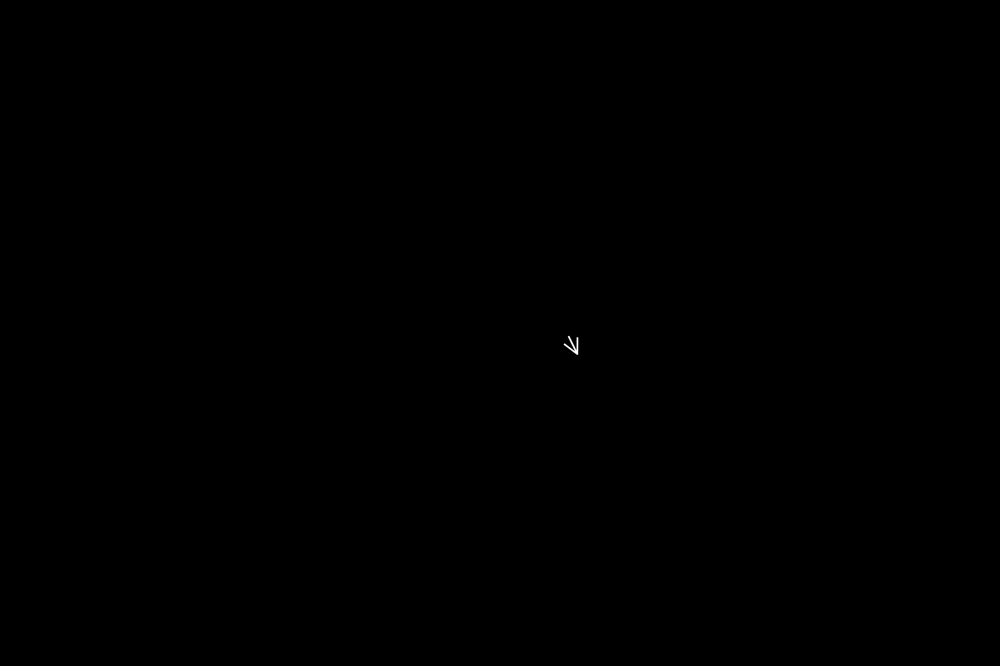

In [16]:
# Run me, don't change me
# Finally, lets plot our robot's pose as a white arrow. Subsequently, 
# on the same plot, we will show the point cloud

plot()  
plot_2D_robot(pos[1,:], pos[2,:], limits, (u,v))

### The white arrow indicates the position and orientation of the robot. Now that we know the pose of Cassie, let's also plot the raw point cloud, in the same plot, and see if the rings of the point cloud are consistent with Cassie's pose (i.e., position and orientation).

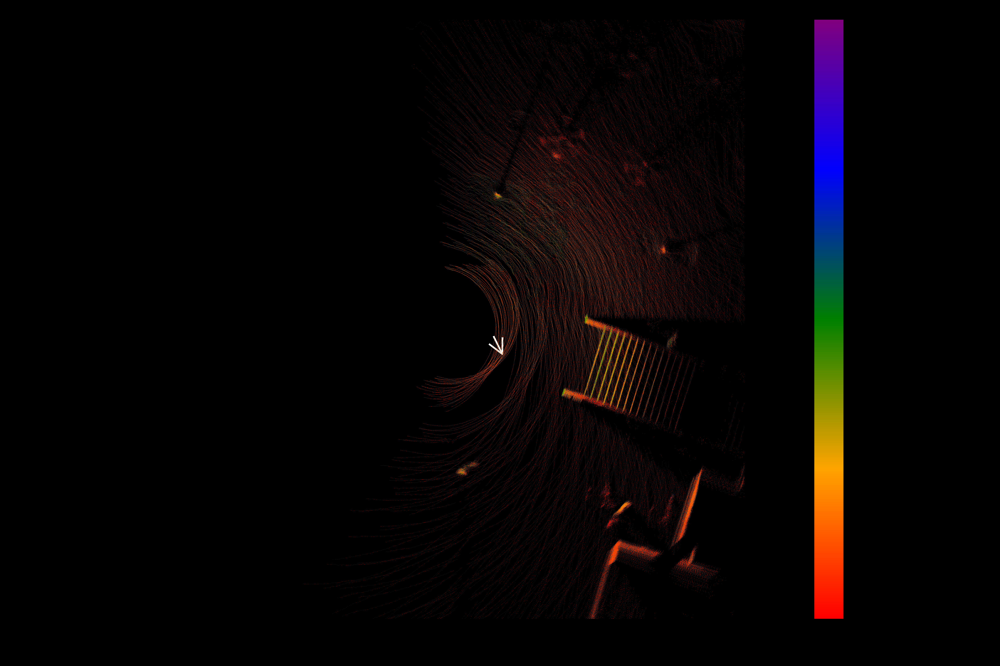

In [17]:
# Run me, don't change me.
#
# Let's now plot the point cloud data. Run this cell as it is 
# to see a plot of the raw pointcloud
# It takes a few seconds to plot, wait for it!


id = end_index # = 13

# save the data into different arrays
(point_data, intensity_data, R, t, pose) = data_parser(id)

plot_3D_pointcloud(point_data[1,:], point_data[2,:], point_data[3,:], limits, intensity_data) 
display(plot!())

Take a close look at the plot you have just generated. As explained in the PDF, the LiDAR is mounted on top of the robot and, **the concentric circles you see in the LiDAR points should be centered about the robot.** What we see, instead, is that the data is translated and rotated with respect to the robot. We need to fix that by applying a homogeneous transformation to the point cloud data.

#### Transform

Time to correct our blunder now! Transform the point cloud into the world frame and plot it with the position arrow as we did before and compare the two plots. You will have to build an affine transformation matrix from the rotation matrix, R,  and translation vector, t, that are given to you.
We know that an affine transformation can be represented as: 
\begin{bmatrix}R_{3 \times 3}& t_{3 \times 1} \\ 0_{1 \times 3} &1\\ \end{bmatrix}
where
- $R_{3 \times 3}$ is a 3 x 3 rotation matrix
- $t_{3 \times 1}$ is a 3 x 1 translation vector
- $0_{1 \times 3}$ is a 1 x 3 row vector of zeros
- and 1 is the number one.

Transform your point cloud and plot the position like we did before. 
Do you see concentric circles of LiDAR originating from our position estimate?!

In [18]:
# Build the transformation from the rotation matrix and translation 
# vector in our code, and save the result as a matrix called H. 
zeros = [0 0 0]
H = [R t; zeros  1]
# your code here



4×4 Matrix{Float64}:
  0.223756   0.968383    0.110305    2.52669
 -0.968393   0.23369    -0.0871998  -0.957787
 -0.11022   -0.0873071   0.990065    1.43545
  0.0        0.0         0.0         1.0

**Before we go any further and use the transformation that you have built, let's check if you got it right!** Please run the following autograder cell which also has some **friendly checks** included with it. If you fail the tests in lines 5 through 8, then go back and see if you can fix your transformation matrix!

In [19]:
# autograder cell
h1 = [0.223755642141881, -0.968392974489662, -0.110220050665654, 0.0]
h2 = [2.52669466213533, -0.957786861851155, 1.4354495810566, 1.0]
@assert isapprox(H[:,1],h1, atol = 0.001)
@assert isapprox(H[:,4],h2, atol = 0.001)

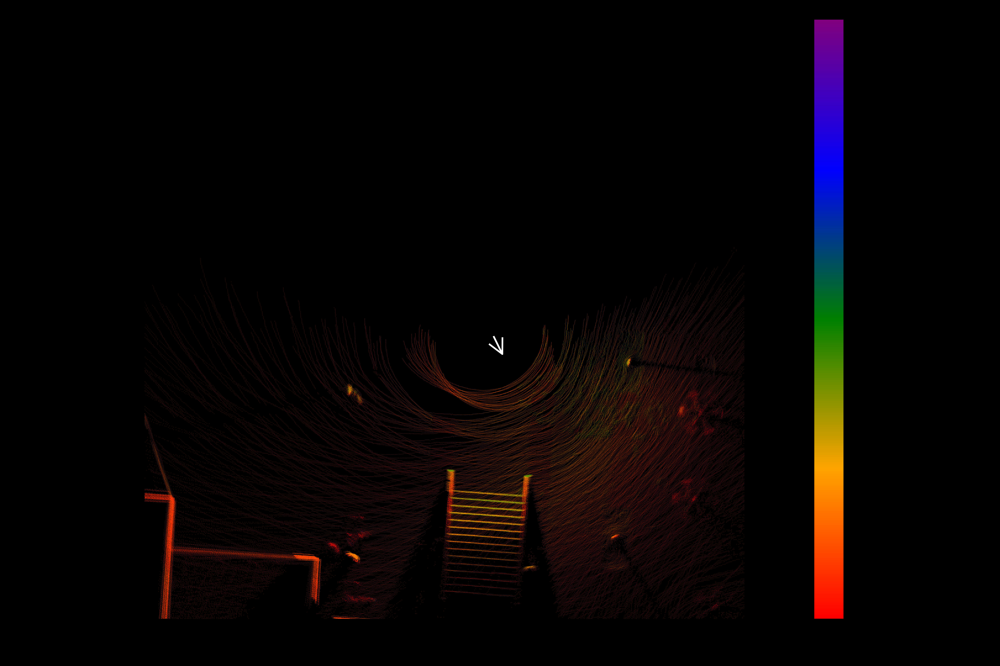

Can you now see that the LiDAR rings are centered about the robot?


In [20]:
# Run me, don't change me.
#
# We are using the transformation matrix that you have just built 
# and verified. (Right, you did verify it?)

# Let's finally transform and plot our data by 
# calling the predefined function generalised from Task 1
transformed_points = affine_transform(point_data, H)

# Visualize
plot() 
plot_3D_pointcloud(transformed_points[1,:], transformed_points[2,:], 
                    transformed_points[3,:], limits, intensity_data)

# Add robot pose to the plot 
plot_2D_robot(pos[1,:], pos[2,:], limits, (u,v))
display(plot!())
println("Can you now see that the LiDAR rings are centered about the robot?")


### Part B ( (3+1) points)

#### BUILDING A MAP and fusing different LiDAR scans!

We now understand how to go from a sensor frame to a world frame. Let us start to build a map by fusing data over multiple time periods. As you will notice from the figure you just made for one second of data, LiDAR scans collected over 1 second are not enough to give us full scene understanding and we therefore need to fuse multiple scans together for a more vivid picture. As much as we would like to give you the full data set and have this be as impressive as the Cassie video, due to time constraints, we are going to have you work with only five seconds (time = 9 to 13 seconds) instead of three minutes of data.

However, one takeaway from this problem should be that the robot is continuously moving and we need to compensate for its motion with an approriate transformation matrix that converts the LiDAR in the sensor frame to LiDAR data in the world frame. The transformation has to be continuously estimated in real-time on the robot. That part of the problem you can learn about in ROB 501 and ROB 530. There is an entire research area that focuses on calculating the best approximate transformations from the moving LiDAR to the fixed world frame. 

Are you convinced yet that we cannot possibly do all of this by hand? In fact to get a computer to execute this as fast as we needed it to go, we had a team of grad students work tirelessly for years, and then at the end of it all, we had 50 almost all freshmen (Go Pilot Class ROB-101!), take that data and visualize and manipulate it, to see for themselves that our algorithm indeed works! 


In [34]:
# Part B
start_index = 9
end_index  = 13

# Iterate over all the clouds over the interval of 9-13 seconds, 
# apply the transformation and plot in the same plot
# The code will take a while to run, so patience grasshopper!

final_points = [];
final_intensity = [];
for id = start_index : end_index 
    transformed_points = [];
    
    #= Your solution should accomplish the following:
    1. Parse the data for the ith time interval using the 
        data_parser function save it in the arrays with the SAME NAME 
        like we did before
    2. Build the Transformation for time interval, using the R, t data
    3. Finally transform your pointcloud and save the result in an 
        array called transformed_points =#
    
    # your code here

    # save the data into different arrays
    (point_data, intensity_data, R, t, pose) = data_parser(id)
    zeros = [0 0 0]
    T = [R t; zeros 1]
    transformed_points = affine_transform(point_data, T)
    

    if(id==start_index)
        final_points = copy(transformed_points)
        final_intensity = intensity_data'
    else
        final_points = [final_points transformed_points]
        final_intensity = [final_intensity intensity_data']
        println("Percent remaining is $(100*(end_index-id)/(end_index-start_index)).")
    end
    
end
@show final_points[:,1:5]

Percent remaining is 75.0.
Percent remaining is 50.0.
Percent remaining is 25.0.
Percent remaining is 0.0.
final_points[:, 1:5] = [2.5354971032966303 7.711682136186845 7.789319078070248 3.0725850069159506 3.798942312378186; 1.9722961774140295 14.224287690542685 11.201209438092262 3.3278194805935355 4.187717472596723; 0.5592545760157881 0.8686608431526084 0.7348563412413707 0.5921945000673924 0.60665999134444]


3×5 Matrix{Float64}:
 2.5355     7.71168    7.78932   3.07259   3.79894
 1.9723    14.2243    11.2012    3.32782   4.18772
 0.559255   0.868661   0.734856  0.592195  0.60666

In [35]:
# autograder cell
final_points_test = [2.5354971032966303 7.711682136186845 7.789319078070248 3.0725850069159506 3.798942312378186; 1.9722961774140295 14.224287690542685 11.201209438092262 3.3278194805935355 4.187717472596723; 0.5592545760157881 0.8686608431526084 0.7348563412413707 0.5921945000673925 0.60665999134444];
@assert isapprox(final_points_test, final_points[:,1:5], atol = 0.0001)

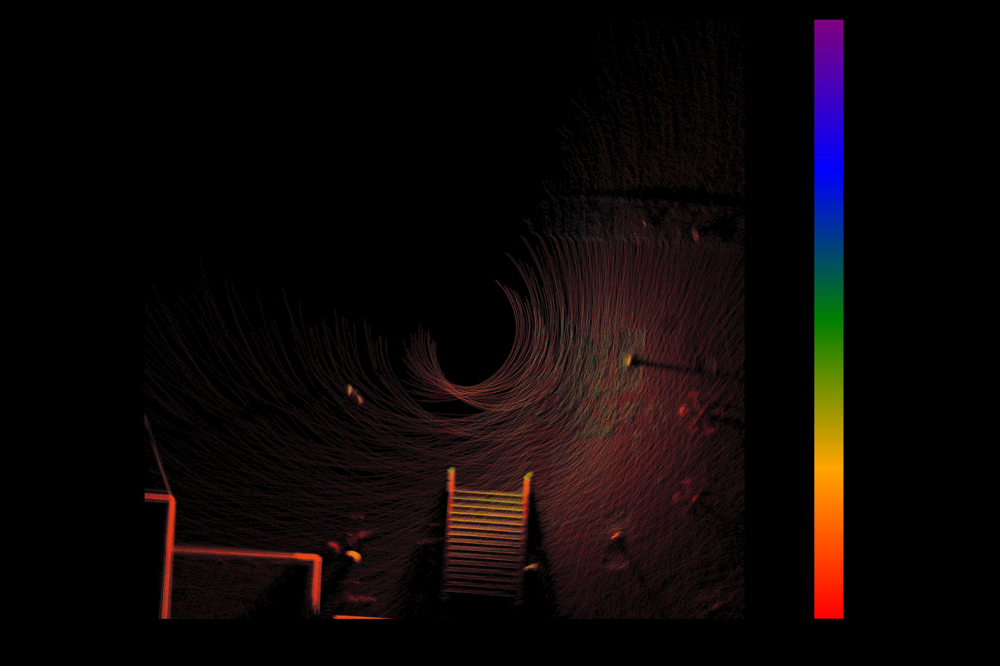

In [36]:
# Again, this will take a while to plot! 
plot()
# Update the plot 
plot_3D_pointcloud(final_points[1,:], final_points[2,:], final_points[3,:], limits, final_intensity')
display(plot!())

### Lets Make a Video

Amazing, so now you have built a map of the staircase in our video!
The next step is to iterate over all the frames and make a gif so that we can see the map being built in real time. Just copy your code from the previous question inside the loop iterating over all frames to build the gif. And this time also, we will add the position of the robot in the animation, seen as the white dot. 

Percent done is 20.0 %
Percent done is 40.0 %
Percent done is 60.0 %
Percent done is 80.0 %
Percent done is 100.0 %
making the gif!!
The white dot is Cassie moving within the map.
The map stays fixed (if we did our work correctly)!


┌ Info: Saved animation to 
│   fn = /home/jovyan/rob101001fa2022/Project1/stairs_walking_five_seconds_zoomed_thirty.gif
└ @ Plots /opt/julia/packages/Plots/PomtQ/src/animation.jl:114


Plots.AnimatedGif("/home/jovyan/rob101001fa2022/Project1/stairs_walking_five_seconds_zoomed_thirty.gif")
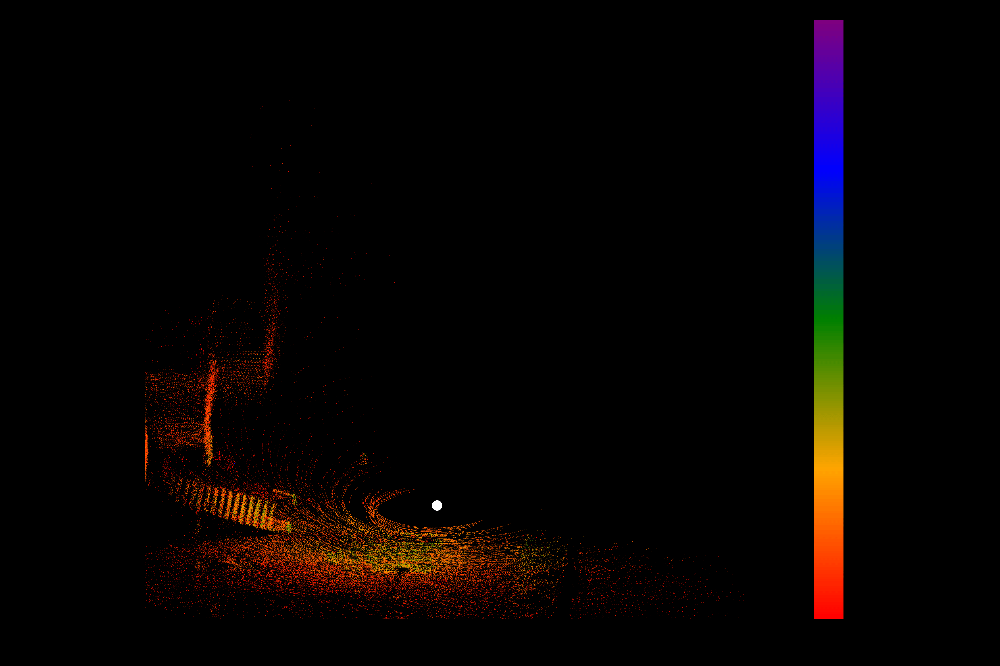

In [37]:
start_index = 9
end_index  = 13
Plots.plot()
# Build an animation!

anim = @animate for id = start_index:end_index 
    transformed_points = [];
    # COPY YOUR CODE BELOW
    
    # your code here
    (point_data, intensity_data, R, t, pose) = data_parser(id)
    zeros = [0 0 0]
    T = [R t; zeros 1]
    transformed_points = affine_transform(point_data, T)
    
    plot_3D_pointcloud(transformed_points[1,:], transformed_points[2,:], transformed_points[3,:], 
            limits, intensity_data, camera=(90,45))
    
    # A Hack for plotting the position
    if(id!=start_index)
        # Plot your previous position with a black dot everytime except the first
        (point_data, intensity_data, R, t, prev_pose) = data_parser(id-1); 
        plot_3D_robot([prev_pose[1,1]],[prev_pose[2,1]],[prev_pose[3,1]], seriescolor=:black)
    end
     
    plot_3D_robot([pose[1,1]],[pose[2,1]],[pose[3,1]],seriescolor=:white)
    println("Percent done is $(100*(1+id-start_index)/(1+end_index-start_index)) %")

    prev_pose = copy(pose);
end
println("making the gif!!")
println("The white dot is Cassie moving within the map.")
println("The map stays fixed (if we did our work correctly)!")
gif(anim, "stairs_walking_five_seconds_zoomed_thirty.gif", fps = 1)